In [1]:
import shapely as shp
import pandas as pd, numpy as np, matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle
from shapely.geometry import MultiPoint
import geopandas as gpd
import descartes
import seaborn as sns
%matplotlib inline

In [2]:
fname = 'Data/tracks_listing_households.geojson'
tracks = gpd.GeoDataFrame.from_file(fname)
print tracks.crs

{}


In [3]:
totalshape = tracks.geometry[1]
for shape in tracks.geometry:
    totalshape = totalshape.union(shape)

In [4]:
totalshape

In [5]:
un = totalshape.envelope.symmetric_difference(totalshape)
un

In [6]:
gdf = gpd.GeoDataFrame.from_file('Data/jp-sample.geojson')
gdf.head()


,Entire_home/apt,Median_income,Median_rent,Private_room,Shared_room,accesstosubway,agglomerative,agglomerativeCat,availability_365,beer_count,...,latitude,longitude,minimum_nights,name,neighbourhood,neighbourhood_group,number_of_reviews,price,reviews_per_month,room_type
0,0,21855.0,1287.0,1,0,8.368050,2,2,242,0,...,40.812747,-73.864061,2,Community Living in the Heart & Soul of NYC (3C),Clason Point,Bronx,9,59,1.53,Private room
1,0,21855.0,1287.0,1,0,8.380864,2,2,365,0,...,40.812934,-73.863814,2,"Private Room for 2, Community House NYC (2A)",Clason Point,Bronx,2,43,0.42,Private room
2,0,21855.0,1287.0,1,0,8.406552,2,2,336,0,...,40.813600,-73.863705,1,King sized bed + futon in Large Private Room ...,Clason Point,Bronx,6,76,1.37,Private room
3,0,21855.0,1287.0,1,0,8.371107,2,2,327,0,...,40.813822,-73.865384,2,"Private & Quiet Room for Two, Twin Beds (2D)",Clason Point,Bronx,17,43,3.27,Private room
4,0,21855.0,1287.0,1,0,8.428738,2,2,328,0,...,40.813927,-73.863285,2,Room for 2 in private community house in NYC (3A),Clason Point,Bronx,4,43,0.91,Private room


In [ ]:
df4

In [69]:
df0 = gdf[gdf['kmeans'] ==0 ]
df1 = gdf[gdf['kmeans'] ==1 ]
df2 = gdf[gdf['kmeans'] ==2 ]
df3 = gdf[gdf['kmeans'] ==3 ]
df4 = gdf

In [70]:
listofdf = [df0,df1,df2,df3,df4]
thenames = ['Normal People','The 2%', 'Central Action', 'Hip Kids','All Listings']

In [9]:
df = gdf[['latitude','longitude']]
coords = gdf.as_matrix(columns=['latitude','longitude'])

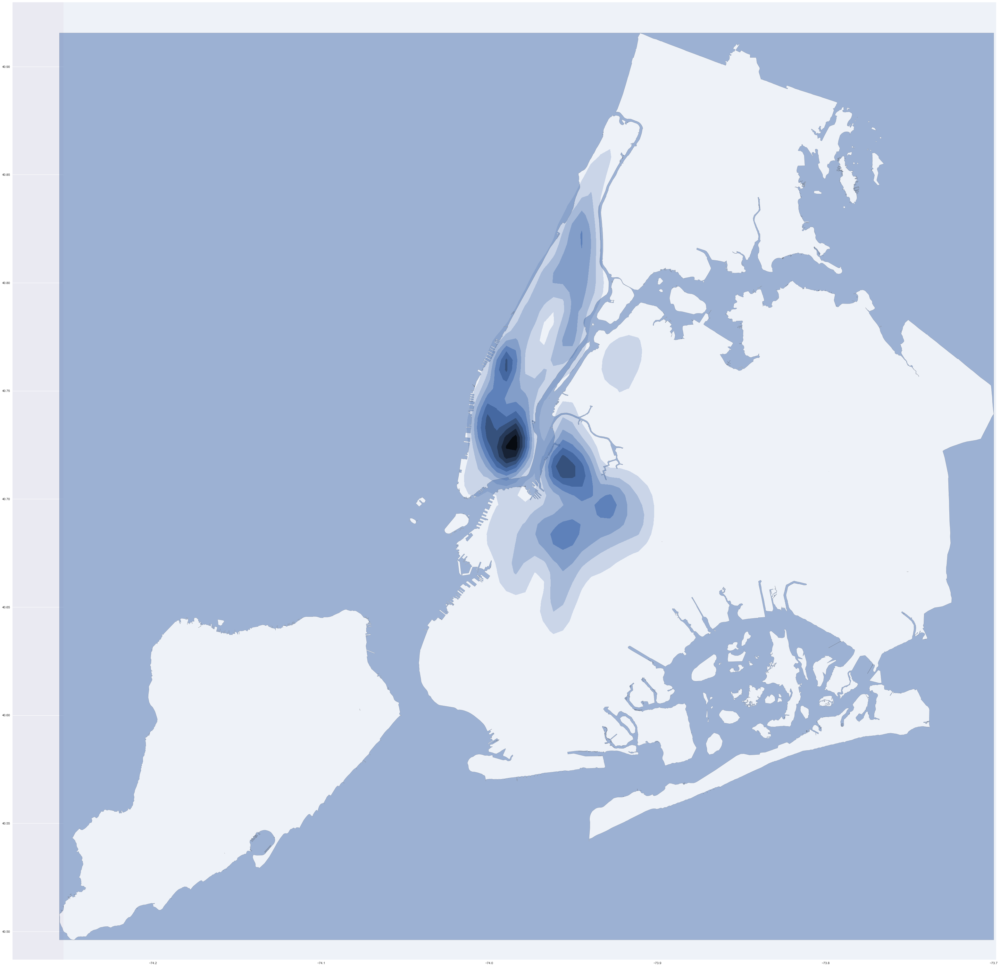

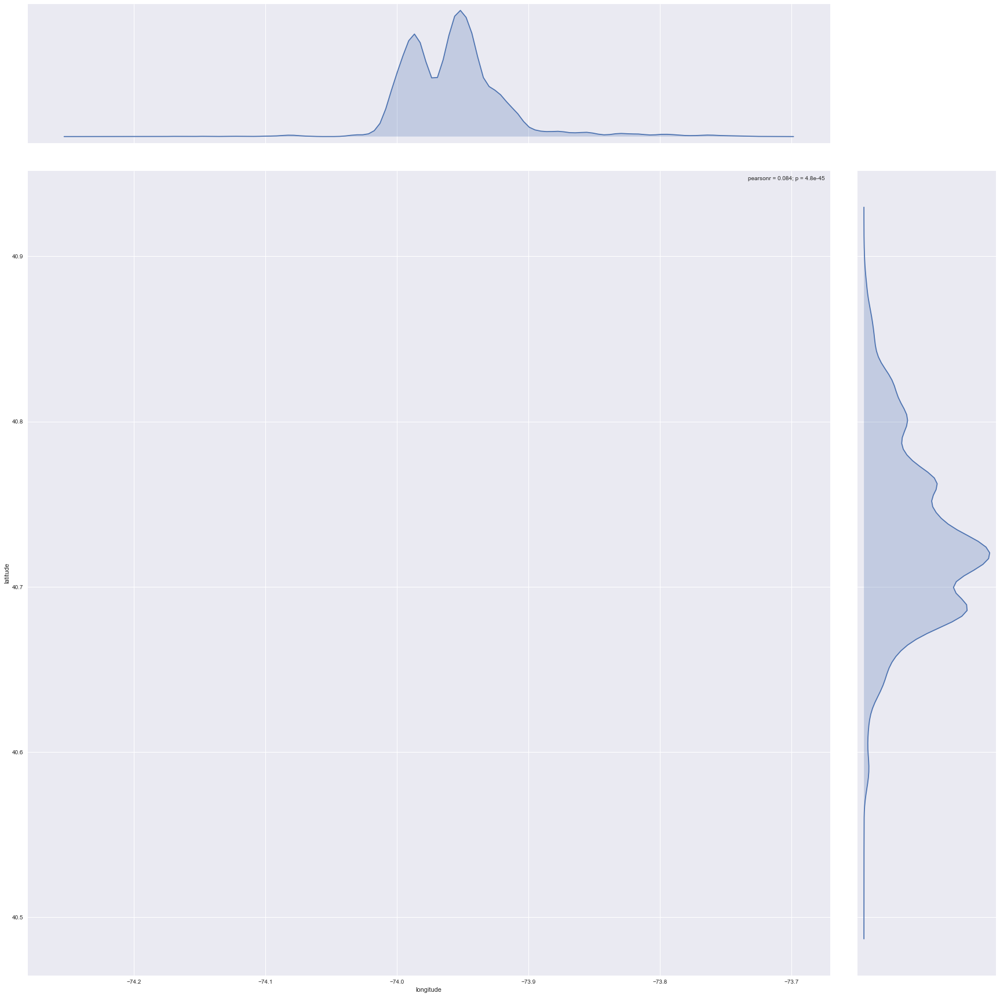

In [10]:
f, ax = plt.subplots(figsize=(55,55))
for polygon in un:

    patch = descartes.PolygonPatch(polygon, alpha=0.5, zorder=2)
    ax.add_patch(patch)
sns.jointplot(x="longitude", y="latitude", data=gdf, kind="kde", size=24,ax=ax)

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from matplotlib.colors import ListedColormap    
mycolor1 = ListedColormap('k')
mycolor2 = ListedColormap('w')



C:\Users\ferna\Anaconda2\lib\site-packages\matplotlib\cbook\__init__.py:2400: UserWarning: Saw kwargs [u'c', u'color'] which are all aliases for u'color'.  Kept value from u'color'
  seen=seen, canon=canonical, used=seen[-1]))


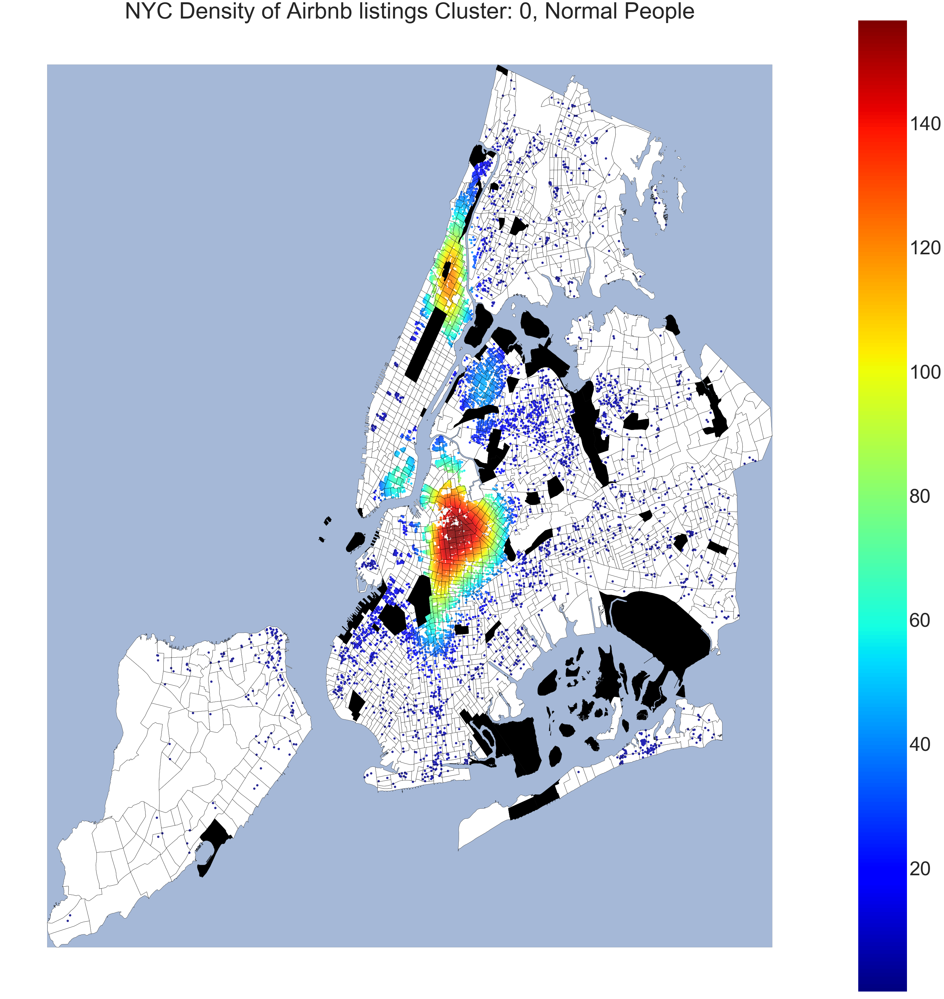

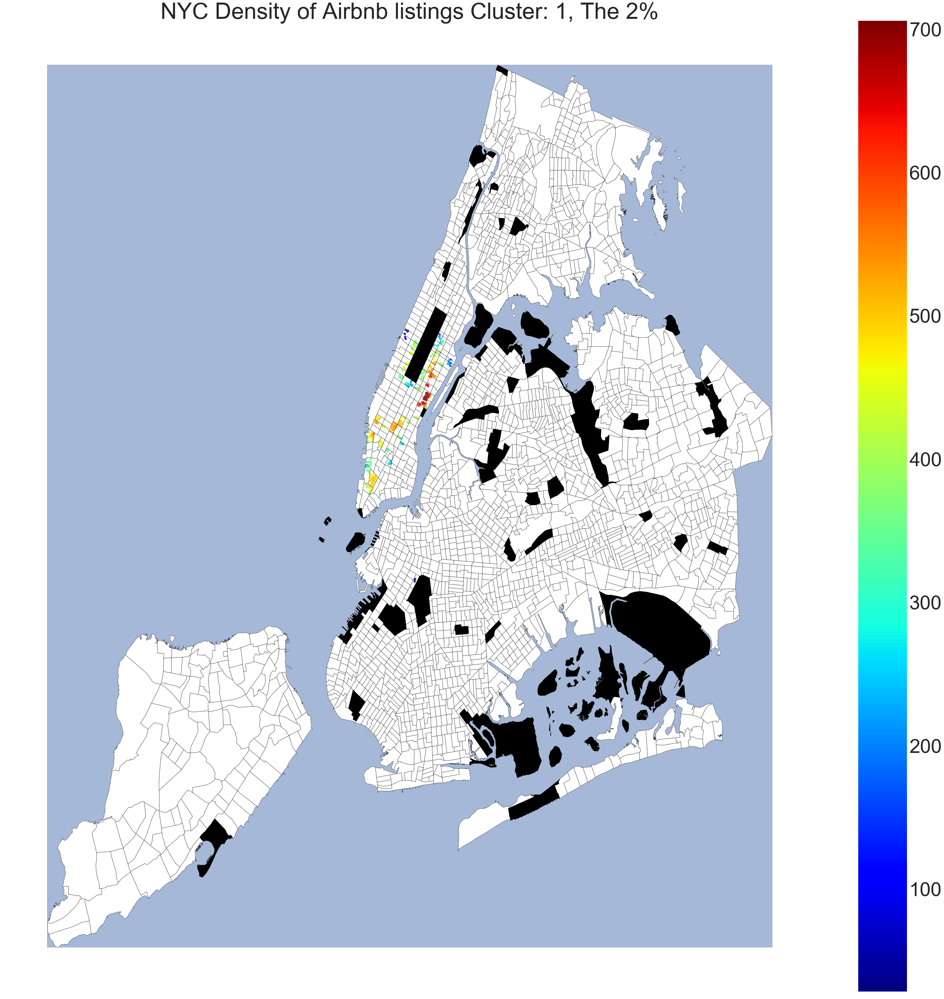

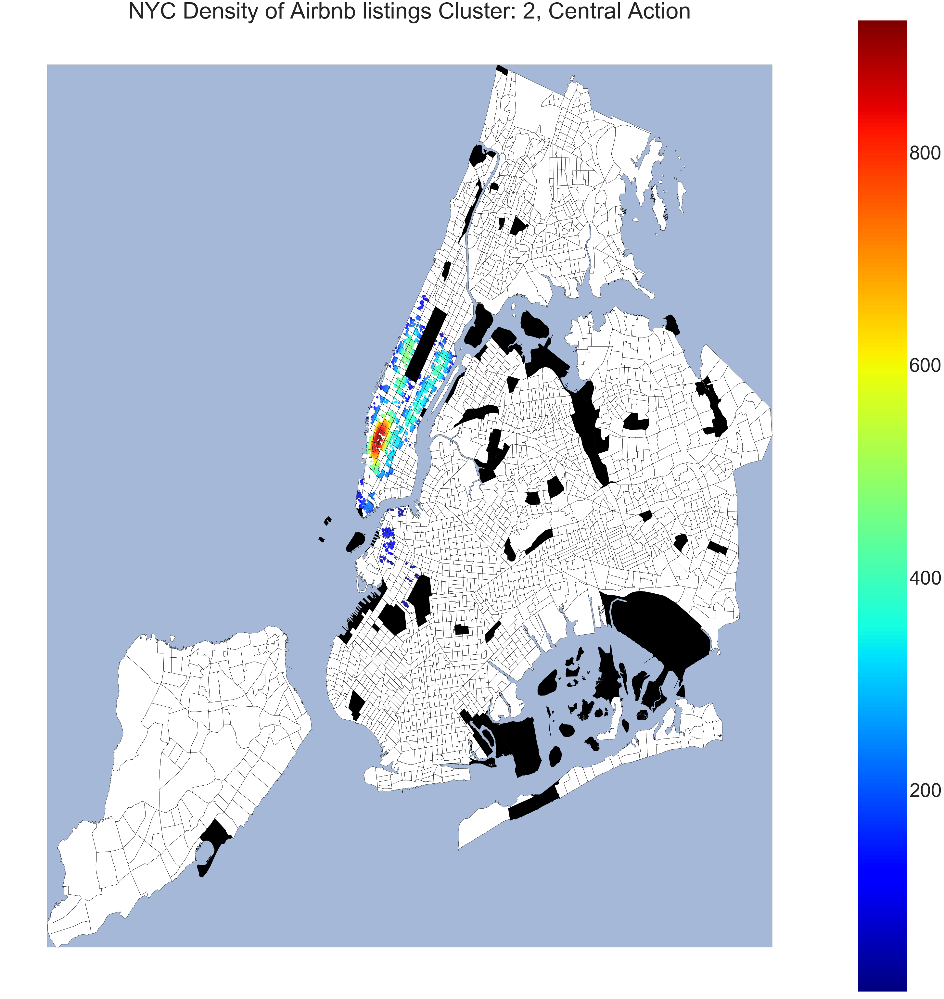

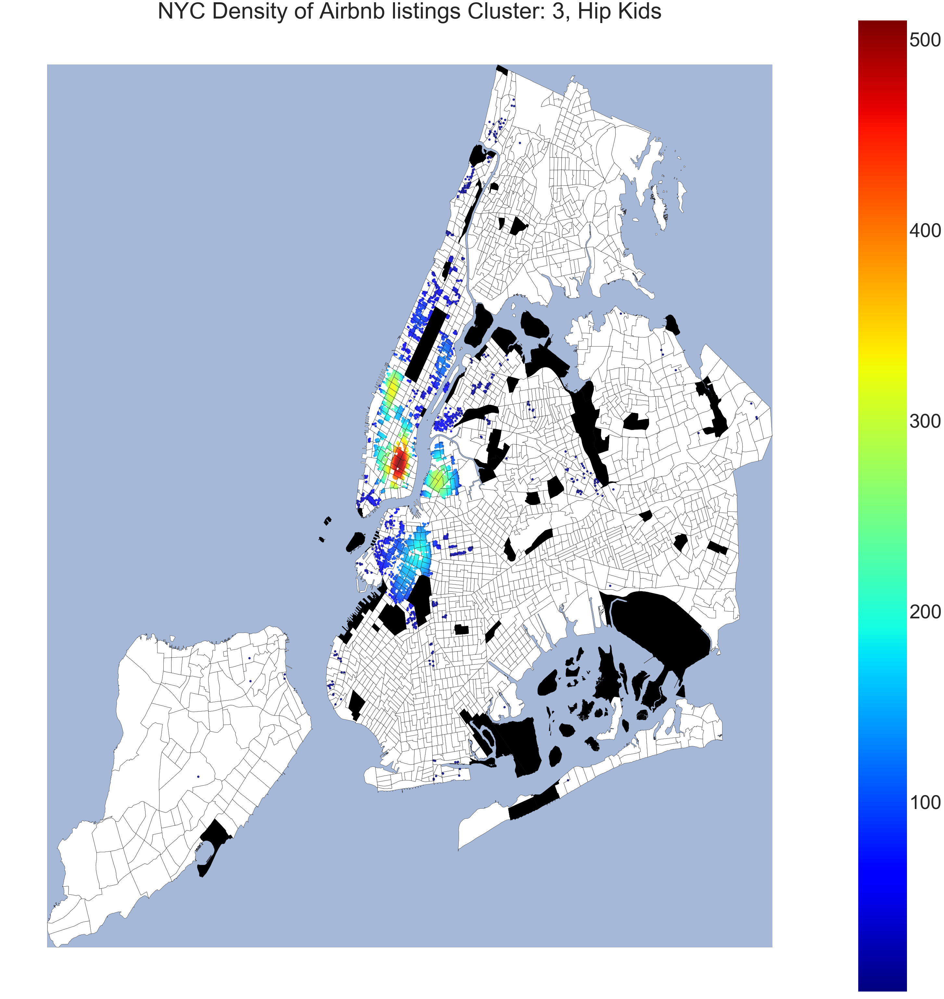

In [12]:
i=0
for df in listofdf:
    
    y = df['latitude'].as_matrix()
    x = df['longitude'].as_matrix()
    # Calculate the point density
    xy = np.vstack([x,y])
    z = gaussian_kde(xy)(xy)
    # Sort the points by density, so that the densest points are plotted last
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    plt.rcParams['axes.facecolor'] = 'white'
    f, ax = plt.subplots(figsize=(55,55))
    plt.rcParams['axes.facecolor'] = 'white'
    for polygon in un:
        patch = descartes.PolygonPatch(polygon, alpha=0.5, zorder=2)
        ax.add_patch(patch)

    tracks[tracks['HD01_VD01']==0].plot(c = 'k', linewidth = .5, ax = ax, cmap=mycolor1, alpha=1)
    tracks[tracks['HD01_VD01']>0].plot(c = 'k', linewidth = .5, ax = ax,  cmap = mycolor2, alpha=.15)
    ax.scatter(x, y, c=z, s=50, edgecolor='', cmap=plt.cm.jet )
    plt.axis('off')
    plt.title("NYC Density of Airbnb listings Cluster: "+str(i)+', '+thenames[i], size=70)
    i+=1
    normalize = mcolors.Normalize(vmin=min(z),vmax=max(z))
    colormap = cm.jet
    scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=colormap)
    scalarmappaple.set_array(df.assign(cl = z))
    cbar = plt.colorbar(scalarmappaple, ax=ax)
    cbar.ax.tick_params(labelsize=60)
    plt.rcParams['axes.facecolor'] = 'white'
    plt.show()
    plt.rcParams['axes.facecolor'] = 'white'

In [13]:
features =[u'Median_income',
     #u'Median_rent',
     #u'accesstosubway',
     #u'availability_365',
     u'beer_count',
     #u'boro_ct_2010',
     #u'calculated_host_listings_count',
     u'coffee_count',
     u'connectivityScore',
     #'geometry',
     #u'host_id',
     #u'host_name',
     #u'id',
     #u'index_left',
     #u'last_review',
     #u'latitude',
     #u'longitude',
     #u'minimum_nights',
     #u'name',
     #u'neighbourhood',
     #u'neighbourhood_group',
     #u'number_of_reviews',
     u'price',
     #u'reviews_per_month',
     #u'room_type',
     #'Private_room',
     #'Entire_home/apt',
     #'Shared_room'
          ]
features

[u'Median_income',
 u'beer_count',
 u'coffee_count',
 u'connectivityScore',
 u'price']

In [14]:
def violin_feature(feature, classifier):
    f, ax = plt.subplots(figsize=(5,5))
    sns.violinplot(x=classifier, y=feature, data=gdf, inner=None, ax=ax)
    ax.set_title('{0} distribution with {1}'.format(feature, classifier), fontsize=15)
    ax.set_xlabel('Categories', fontsize=15)
    plt.xticks( fontsize = 15)
    plt.yticks( fontsize = 15)
    ax.set_ylabel(feature, fontsize=15)

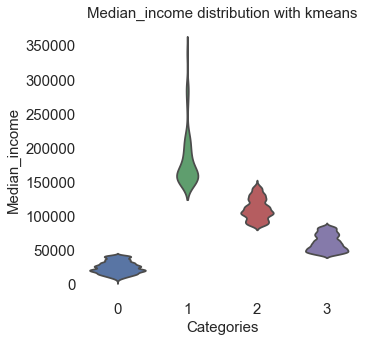

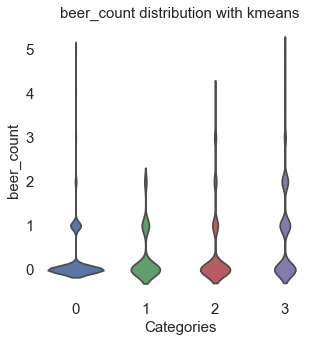

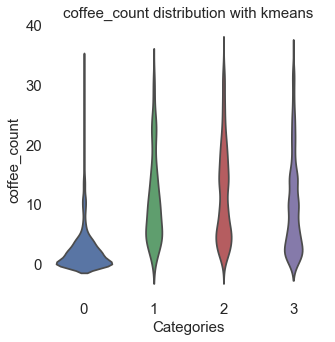

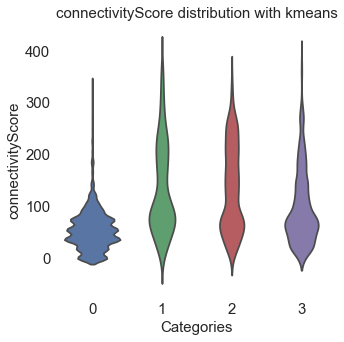

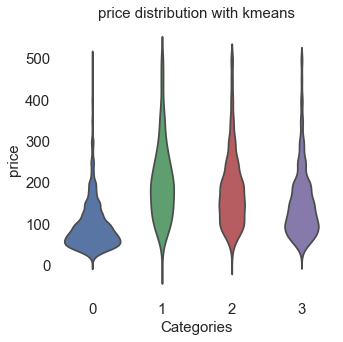

In [15]:
for feat in features:
    violin_feature(feat, 'kmeans')

In [16]:
def feature_dist(feature, classifier):
    for cid in set(gdf[classifier]):
        sns.distplot(gdf[gdf[classifier] == cid][feature], hist=False, label=str(cid))
        

    plt.legend()
    plt.show()

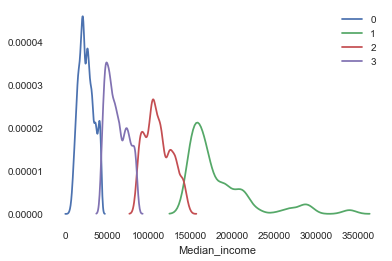

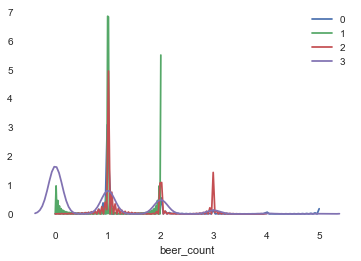

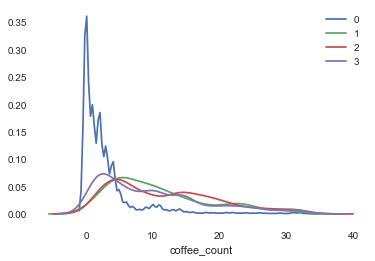

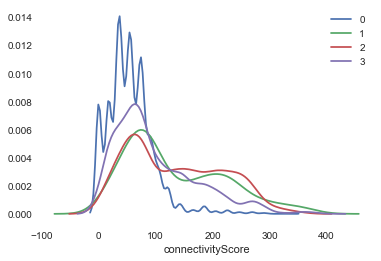

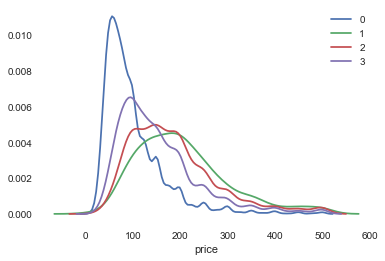

In [17]:
for feat in features:
    feature_dist(feat, 'kmeans')

[Text(0.5,0,u'Connectivity Score Distribution')]

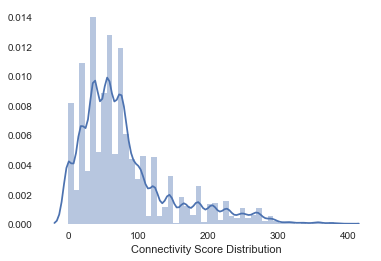

In [19]:

ax = sns.distplot(gdf.connectivityScore)
ax.set(xlabel='Connectivity Score Distribution')

In [24]:
type(listofdf)

list

In [27]:
listofdf[0]

,Entire_home/apt,Median_income,Median_rent,Private_room,Shared_room,accesstosubway,agglomerative,agglomerativeCat,availability_365,beer_count,...,latitude,longitude,minimum_nights,name,neighbourhood,neighbourhood_group,number_of_reviews,price,reviews_per_month,room_type
0,0,21855.0,1287.0,1,0,8.368050,2,2,242,0,...,40.812747,-73.864061,2,Community Living in the Heart & Soul of NYC (3C),Clason Point,Bronx,9,59,1.53,Private room
1,0,21855.0,1287.0,1,0,8.380864,2,2,365,0,...,40.812934,-73.863814,2,"Private Room for 2, Community House NYC (2A)",Clason Point,Bronx,2,43,0.42,Private room
2,0,21855.0,1287.0,1,0,8.406552,2,2,336,0,...,40.813600,-73.863705,1,King sized bed + futon in Large Private Room ...,Clason Point,Bronx,6,76,1.37,Private room
3,0,21855.0,1287.0,1,0,8.371107,2,2,327,0,...,40.813822,-73.865384,2,"Private & Quiet Room for Two, Twin Beds (2D)",Clason Point,Bronx,17,43,3.27,Private room
4,0,21855.0,1287.0,1,0,8.428738,2,2,328,0,...,40.813927,-73.863285,2,Room for 2 in private community house in NYC (3A),Clason Point,Bronx,4,43,0.91,Private room
5,0,21855.0,1287.0,1,0,8.388353,2,2,365,0,...,40.814121,-73.865115,2,Heart & Soul of NYC - Bronx Community Living (2C),Clason Point,Bronx,2,59,0.37,Private room
6,0,21855.0,1287.0,1,0,8.421343,2,2,325,0,...,40.814205,-73.863943,2,Private Room Quiet Neighborhood Twin Beds (3D),Clason Point,Bronx,12,43,2.02,Private room
7,0,21855.0,1287.0,1,0,8.400627,2,2,357,0,...,40.814493,-73.865140,3,Large Private Room in Quiet Neighborhood (2B),Clason Point,Bronx,6,77,1.25,Private room
8,1,15411.0,1543.0,0,0,8.540691,2,2,284,0,...,40.811498,-73.856068,2,Garden House in the East Bronx,Clason Point,Bronx,26,110,1.23,Entire home/apt
9,1,18834.0,1411.0,0,0,8.631690,2,2,274,0,...,40.811922,-73.853335,2,Hamiltons Hideway Lower Level Apt NYC,Clason Point,Bronx,3,145,0.11,Entire home/apt


In [28]:
z

array([  4.33309697e-01,   4.33309697e-01,   4.33309697e-01, ...,
         5.09406424e+02,   5.09564326e+02,   5.09917889e+02])

import plotly.plotly as py

#df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2015_06_30_precipitation.csv')

scl = [0,"rgb(150,0,90)"],[0.125,"rgb(0, 0, 200)"],[0.25,"rgb(0, 25, 255)"],\
[0.375,"rgb(0, 152, 255)"],[0.5,"rgb(44, 255, 150)"],[0.625,"rgb(151, 255, 0)"],\
[0.75,"rgb(255, 234, 0)"],[0.875,"rgb(255, 111, 0)"],[1,"rgb(255, 0, 0)"]

for df in listofdf[:1]:
    
    y = df['latitude'].as_matrix()
    x = df['longitude'].as_matrix()
    # Calculate the point density
    xy = np.vstack([x,y])
    z = gaussian_kde(xy)(xy)
    # Sort the points by density, so that the densest points are plotted last
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    
    data = [ dict(
        lat = y,
        lon = x,
        text = df['neighbourhood'].astype(str),
        marker = dict(
            color = z,
            #colorscale = scl,
            #reversescale = True,
            opacity = 0.7,
            #size = 2,
            colorbar = dict(
                thickness = 10,
                titleside = "right",
                outlinecolor = "rgba(68, 68, 68, 0)",
                ticks = "outside",
                ticklen = 3,
                showticksuffix = "last",
                ticksuffix = " inches",
                dtick = 0.1
            ),
        ),
        type = 'scattergeo'
    ) ]

    layout = dict(
        geo = dict(
            scope = 'new york',
            showland = True,
            landcolor = "rgb(212, 212, 212)",
            subunitcolor = "rgb(255, 255, 255)",
            countrycolor = "rgb(255, 255, 255)",
            showlakes = True,
            lakecolor = "rgb(255, 255, 255)",
            showsubunits = True,
            showcountries = True,
            resolution = 50,
            projection = dict(
                type = 'conic conformal',
                rotation = dict(
                    lon = -100
                )
            ),
            lonaxis = dict(
                showgrid = True,
                gridwidth = 0.5,
                range= [ -140.0, -55.0 ],
                dtick = 5
            ),
            lataxis = dict (
                showgrid = True,
                gridwidth = 0.5,
                range= [ 20.0, 60.0 ],
                dtick = 5
            )
        ),
        title = 'Airbnb Classification',
    )
    fig = { 'data':data, 'layout':layout }

py.iplot(fig, filename='Airbnb')

In [39]:
thenames

['Normal People', 'The 2%', 'Central Action', 'Hip Kids']

In [64]:

#import plotly.plotly as py
from plotly.graph_objs import *
from plotly.graph_objs import *

def scatt(x,y,z, name, text_str):
    data = Data([
    Scattermapbox(
        lat=y,
        lon=x,
        showlegend=True,
        name = thenames[count],
        mode='markers',
        marker=Marker(
            size=9,
            color = z,
            colorscale='Jet',
            colorbar = dict(
                thickness = 10,
                titleside = "right",
                #outlinecolor = "rgba(68, 68, 68, 0)",
                ticks = "outside",
                #ticklen = 3,
                #showticksuffix = "last",
                #ticksuffix = " inches",
                #dtick = 0.1
            )
        ),
        text=text_str,
    )])
    return data
    
mapbox_access_token = 'pk.eyJ1IjoibG1mNDQ1IiwiYSI6ImNqYzk2dGZoMTJ5Y3EzM3I1Zm9ha2pmbW8ifQ.yxcJVd1-XTC5lGXMlyHBiQ'
count = 0
fin_data = []
for df in listofdf[:]:
    
    y = df['latitude'].as_matrix()
    x = df['longitude'].as_matrix()
    # Calculate the point density
    xy = np.vstack([x,y])
    z = gaussian_kde(xy)(xy)
    # Sort the points by density, so that the densest points are plotted last
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    name = thenames[count]
    text_str = df['neighbourhood'].as_matrix()[idx]
    fin_data.append(scatt(x,y,z, name,text_str))
    count+=1
    

layout = Layout(
    #autosize=True,
    autosize=False,
    width=900,
    height=900,
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=dict(
            lat=40.7668,
            lon=-73.9765 #40.766818, -73.976545
        ),
        pitch=0,
        zoom=10,
        style='dark'
    ),
    xaxis=dict(
        #showgrid=True,
        #zeroline=True,
        showline=True,
        mirror='ticks',
        #gridcolor='#bdbdbd',
        #gridwidth=2,
        #zerolinecolor='#969696',
        #zerolinewidth=4,
        linecolor='#636363',
        linewidth=6
    ),
    yaxis=dict(
        #showgrid=True,
        #zeroline=True,
        showline=True,
        mirror='ticks',
        #gridcolor='#bdbdbd',
        #gridwidth=2,
        #zerolinecolor='#969696',
        #zerolinewidth=4,
        linecolor='#636363',
        linewidth=6
    ),
)

fig = dict(data=fin_data[0], layout=layout)
py.iplot(fig, filename='Multiple test')

In [71]:
 thenames

['Normal People', 'The 2%', 'Central Action', 'Hip Kids', 'All Listings']

In [75]:
#import plotly.plotly as py
from plotly.graph_objs import *

def scatt(x,y,z, name, text_str):
    if name == 'All Listings':
        vis=True
    else:
        vis=False
    data = Scattermapbox(
        lat=y,
        lon=x,
        visible=vis,
        showlegend=True,
        name = thenames[count],
        mode='markers',
        marker=Marker(
            size=9,
            color = z,
            colorscale='Jet',
            colorbar = dict(
                thickness = 10,
                titleside = "right",
                #outlinecolor = "rgba(68, 68, 68, 0)",
                ticks = "outside",
                
                #ticklen = 3,
                #showticksuffix = "last",
                #ticksuffix = " inches",
                #dtick = 0.1
            )
        ),
        text=text_str,
    )
    return data
    
mapbox_access_token = 'pk.eyJ1IjoibG1mNDQ1IiwiYSI6ImNqYzk2dGZoMTJ5Y3EzM3I1Zm9ha2pmbW8ifQ.yxcJVd1-XTC5lGXMlyHBiQ'
count = 0
fin_data = []
for df in listofdf[:]:
    
    y = df['latitude'].as_matrix()
    x = df['longitude'].as_matrix()
    # Calculate the point density
    xy = np.vstack([x,y])
    z = gaussian_kde(xy)(xy)
    # Sort the points by density, so that the densest points are plotted last
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    name = thenames[count]
    text_str = df['neighbourhood'].as_matrix()[idx]
    fin_data.append(scatt(x,y,z, name,text_str))
    count+=1
    
    
    
updatemenus = list([
    dict(type="buttons",
         active=-1,
         buttons=list([
            dict(label = thenames[4],
                 method = 'update',
                 args = [{'visible': [False, False, False, False, True]},
                         {'title': thenames[4],
                          #'annotations': high_annotations
                         }]),
            dict(label = thenames[0],
                 method = 'update',
                 args = [{'visible': [True, False, False, False,False]},
                         {'title': thenames[0],
                          #'annotations': high_annotations
                         }]),
            dict(label = thenames[1],
                 method = 'update',
                 args = [{'visible': [False, True, False, False, False]},
                         {'title': thenames[1],
                          #'annotations': high_annotations
                         }]),
            dict(label = thenames[2],
                 method = 'update',
                 args = [{'visible': [False, False, True, False, False]},
                         {'title': thenames[2],
                          #'annotations': high_annotations
                         }]),
            dict(label = thenames[3],
                 method = 'update',
                 args = [{'visible': [False, False, False, True, False]},
                         {'title': thenames[3],
                          #'annotations': high_annotations
                         }]),
        ]),
    )
])    

layout = Layout(
    #autosize=True,
    updatemenus=updatemenus,
    title='Airbnb Automated Classification System',
    autosize=False,
    width=900,
    height=900,
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=dict(
            lat=40.7668,
            lon=-73.9765 #40.766818, -73.976545
        ),
        pitch=0,
        zoom=10,
        style='light'
    ),
    xaxis=dict(
        #showgrid=True,
        #zeroline=True,
        showline=True,
        mirror='ticks',
        #gridcolor='#bdbdbd',
        #gridwidth=2,
        #zerolinecolor='#969696',
        #zerolinewidth=4,
        linecolor='#636363',
        linewidth=6
    ),
    yaxis=dict(
        #showgrid=True,
        #zeroline=True,
        showline=True,
        mirror='ticks',
        #gridcolor='#bdbdbd',
        #gridwidth=2,
        #zerolinecolor='#969696',
        #zerolinewidth=4,
        linecolor='#636363',
        linewidth=6
    ),
    legend=dict(orientation="h")
)

fig = dict(data=fin_data, layout=layout)
py.iplot(fig, filename='Airbnb_Automated_Classification_System')